# Qdrant & Image Data

## 1. Setup QDrant

In [1]:
from transformers import AutoImageProcessor, AutoModel
from qdrant_client import QdrantClient
from qdrant_client import models
from datasets import load_dataset
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
client = QdrantClient(location=":memory:")

In [4]:
my_collection = "image_collection"
client.recreate_collection(
    collection_name=my_collection,
    vectors_config=models.VectorParams(size=1536, distance=models.Distance.COSINE)
)

/var/folders/7g/9rtz76hn4j5_ws3_z5kszxk40000gn/T/ipykernel_40839/441211821.py:2: DeprecationWarning: `recreate_collection` method is deprecated and will be removed in the future. Use `collection_exists` to check collection existence and `create_collection` instead.
  client.recreate_collection(


True

## 2. Create dataset

In [5]:
dataset = load_dataset("imagefolder", data_dir='./data/leather-data/Train/', split='train')
dataset

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'image_id', 'class', 'description'],
    num_rows: 47
})

In [6]:
dataset[0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=352x352>,
 'image_id': 'color (1).png',
 'class': 'Color',
 'description': 'Color contamination on the leather'}

(480, 512)


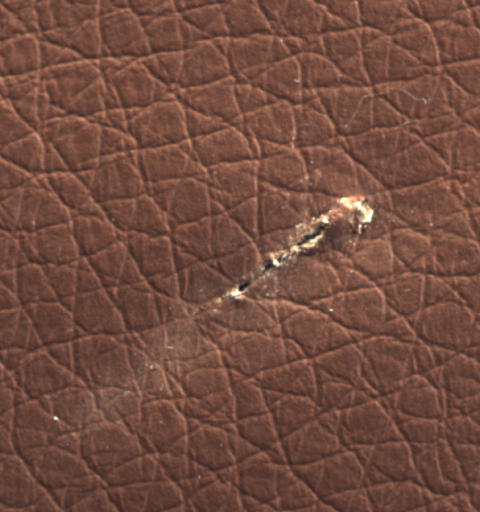

In [7]:
image = dataset[9]["image"]
print(image.size)
image

## 3. Create image embeddings

In [10]:
device = torch.device("mps")#torch.device("cuda" if torch.cuda.is_available() else "cpu")
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base").to(device)

class CustomPooling(nn.Module):
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model
        
    def forward(self, **inputs):
        outputs = self.base_model(**inputs)
        hidden_states = outputs.last_hidden_state
        
        # Extract CLS token
        cls_embedding = hidden_states[:, 0]
        
        # Extract patch tokens and apply attention pooling
        patch_tokens = hidden_states[:, 1:]
        attn_weights = F.softmax(torch.matmul(cls_embedding.unsqueeze(1), patch_tokens.transpose(1, 2)), dim=-1)
        context_vector = torch.matmul(attn_weights, patch_tokens).squeeze(1)
        
        # Combine CLS and attention-pooled context
        final_embedding = torch.cat([cls_embedding, context_vector], dim=-1)
        
        return final_embedding

# Create the model with custom pooling
custom_model = CustomPooling(model).to(device)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [12]:
from src.cnn import ViTNetwork

# Instantiate the base model and the build the siamese network on top of it
base_model = AutoModel.from_pretrained("facebook/dinov2-base").to(device)
custom_model = ViTNetwork(base_model, 10)
custom_model = custom_model.to(device)

custom_model.load_state_dict(torch.load('./models/ViT-tilda-finetuning_best_model.pth'))

Unfreezing layer: encoder.layer.11.layer_scale1.lambda1
Unfreezing layer: encoder.layer.11.norm2.weight
Unfreezing layer: encoder.layer.11.norm2.bias
Unfreezing layer: encoder.layer.11.mlp.fc1.weight
Unfreezing layer: encoder.layer.11.mlp.fc1.bias
Unfreezing layer: encoder.layer.11.mlp.fc2.weight
Unfreezing layer: encoder.layer.11.mlp.fc2.bias
Unfreezing layer: encoder.layer.11.layer_scale2.lambda1
Unfreezing layer: layernorm.weight
Unfreezing layer: layernorm.bias


<All keys matched successfully>

Let's process the instance of melanoma we selected earlier using our feature extractor from above. To learn more about `ViTImageProcessor`
and `ViTModel`, check out the [docs here](https://huggingface.co/docs/transformers/tasks/image_classification).

In [13]:
inputs = processor(images=image, return_tensors="pt").to(device)
inputs['pixel_values'].shape, inputs

(torch.Size([1, 3, 224, 224]),
 {'pixel_values': tensor([[[[ 0.1254, -0.0629,  0.0056,  ..., -0.1828,  0.1426,  0.0056],
           [ 0.0569, -0.1314, -0.1143,  ..., -0.1486,  0.0912, -0.0972],
           [ 0.0569, -0.0116, -0.1486,  ..., -0.2342, -0.0287, -0.1999],
           ...,
           [-0.6965, -0.6623, -0.3027,  ..., -0.4911, -0.3712, -0.2684],
           [-0.7137, -0.4739, -0.1143,  ..., -0.6281, -0.5424, -0.4226],
           [-0.9020, -0.6623, -0.3027,  ..., -0.5938, -0.4397, -0.4054]],
 
          [[-0.5651, -0.6352, -0.6001,  ..., -0.7577, -0.5126, -0.6001],
           [-0.5476, -0.6176, -0.6527,  ..., -0.7577, -0.5651, -0.6702],
           [-0.5476, -0.5826, -0.6702,  ..., -0.8102, -0.6702, -0.7402],
           ...,
           [-1.0378, -1.0203, -0.8277,  ..., -0.9503, -0.9153, -0.8102],
           [-1.1078, -0.9328, -0.7052,  ..., -1.0203, -0.9853, -0.8978],
           [-1.2129, -1.0728, -0.8452,  ..., -1.0378, -0.9328, -0.8627]],
 
          [[-0.6367, -0.6541, -0.6193,

In [15]:
one_embedding = custom_model(inputs['pixel_values'])
one_embedding.shape

torch.Size([1, 1536])

As you can see above, what we get back from our preprocessing function is a multi-dimensional tensor represented
as [`batch_size`, `channels`, `rows`, `columns`]. The `batch_size` is the amount of samples passed through our
feature extractor and the channels represent the red, green, and blue hues of the image. Lastly, the rows and
columns, which can also be thought of as vectors and dimensions, represent the width and height of the image. This
4-dimensional representation is the input our model expects. In return, we get back a tensor
of [`batch_size`, `patches`, `dimensions`], and what's left for us to do is to choose a pooling method
for our embedding as it is not feasible to use 197 embedding vectors when one compressed one would suffice for our use
case. For the final step, we'll use mean pooling.

In [16]:
one_embedding.mean(dim=1).shape

torch.Size([1])

Let's create a function with the process we just walked through above and map it to our dataset to get an
embedding vector for each image.

In [18]:
def get_embeddings(batch):
    inputs = processor(images=batch['image'], return_tensors="pt").to(device)
    with torch.no_grad():
        embeddings = custom_model(inputs['pixel_values']).cpu().numpy()
    batch['embeddings'] = embeddings
    return batch

In [19]:
dataset = dataset.map(get_embeddings, batched=True, batch_size=1)
dataset

Map:   0%|          | 0/47 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'image_id', 'class', 'description', 'embeddings'],
    num_rows: 47
})

Visualize the embeddings

In [20]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne(X, y, title):
    tsne = TSNE(n_components=2, random_state=42)
    X_embedded = tsne.fit_transform(X)
    
    plt.figure(figsize=(8, 6))
    for label in np.unique(y):
        idx = y == label
        plt.scatter(X_embedded[idx, 0], X_embedded[idx, 1], label=f"Class {label}", alpha=0.7)
    plt.title(title)
    plt.xlabel("t-SNE 1")
    plt.ylabel("t-SNE 2")
    plt.legend()
    plt.grid(True)
    plt.show()

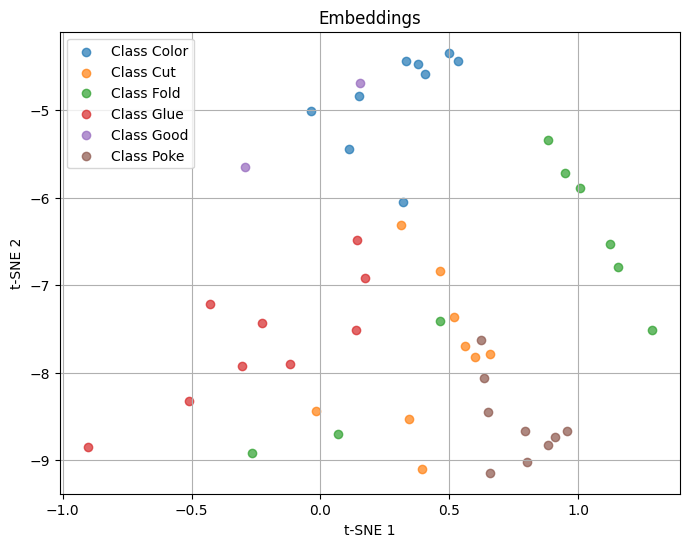

In [21]:
plot_tsne(np.array(dataset['embeddings']),np.array(dataset['class']),"Embeddings")

Notice above that we now have an embedding for each of the images in our dataset, and that's exactly what we were hoping for.

We'll now save the vector of embeddings as a NumPy array so that we don't have to run it again later if
take a break or accidentally close down the tutorial. Then, what we want to do is to create a payload
with the metadata about each of our images. We can accomplish this by converting the rest of the
columns we didn't use into a JSON object for each sample.

In [22]:
np.save("vectors", np.array(dataset['embeddings']), allow_pickle=False)

In [23]:
payload = dataset.select_columns([
    "image_id", "class", 'description'
]).to_pandas().to_dict(orient="records")

payload[:3]

[{'image_id': 'color (1).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'},
 {'image_id': 'color (2).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'},
 {'image_id': 'color (3).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'}]

To make sure each image has an explicit `id` inside of the Qdrant collection we created earlier, we'll create a new column with a range of
numbers equivalent to the rows in our dataset. In addition, we'll load the embeddings we just saved.

In [24]:
ids = list(range(dataset.num_rows))
embeddings = np.load("vectors.npy").tolist()

We are now ready to upsert the combination of ids, vectors and payload to our collection, and we'll do so in batches of 1000.

In [25]:
batch_size = 1

for i in range(0, dataset.num_rows, batch_size):

    low_idx = min(i+batch_size, dataset.num_rows)

    batch_of_ids = ids[i: low_idx]
    batch_of_embs = embeddings[i: low_idx]
    batch_of_payloads = payload[i: low_idx]

    client.upsert(
        collection_name=my_collection,
        points=models.Batch(
            ids=batch_of_ids,
            vectors=batch_of_embs,
            payloads=batch_of_payloads
        )
    )

We can make sure our vectors were uploaded successfully by counting them with the `client.count()` method.

In [26]:
client.count(
    collection_name=my_collection,
    exact=True,
)

CountResult(count=47)

To visually inspect the collection we just created, we can scroll through our vectors with the `client.scroll()` method.

In [27]:
client.scroll(
    collection_name=my_collection,
    limit=5
)

([Record(id=0, payload={'image_id': 'color (1).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=1, payload={'image_id': 'color (2).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=2, payload={'image_id': 'color (3).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=3, payload={'image_id': 'color (4).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=4, payload={'image_id': 'color (5).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None)],
 5)

## 4. Semantic Search

Semantic search, in the context of vector databases and image retrieval, refers to a method of searching for information or images
based on their meaning or content rather than just using keywords. Imagine you're looking for a specific picture of a skin disease and you
don't know the file name or where it is stored. With semantic search, you can describe what you're looking for using words like
"red rashes with blisters," or you can upload an image that will get processed into an embedding vector, and the system will then analyze
the content of the images to find matches that closely match your description or input image.

Semantic search enables a more intuitive and efficient way of searching for images, making it easier to find what you're
looking for, even if you can't remember specific details or tags.

With Qdrant, we can get started searching through our collection with the `client.search()` method.

In [34]:
test_dataset = load_dataset("imagefolder", data_dir='./data/leather-data/Test', split='train')
test_dataset

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'image_id', 'class', 'description'],
    num_rows: 51
})

In [35]:
test_dataset = test_dataset.map(get_embeddings, batched=True, batch_size=1)
test_dataset[0]

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=192x160>,
 'image_id': 'color (1).png',
 'class': 'Color',
 'description': 'Color contamination on the leather',
 'embeddings': [-0.6079211235046387,
  1.83303701877594,
  -0.14562025666236877,
  -0.49418190121650696,
  -2.546485185623169,
  -0.5252175331115723,
  1.7236618995666504,
  -1.5830395221710205,
  -1.801457166671753,
  0.06483215093612671,
  -0.5047985911369324,
  0.25512003898620605,
  -0.9472676515579224,
  -0.01684427261352539,
  -1.7424752712249756,
  1.0012075901031494,
  -3.0371177196502686,
  0.8059259653091431,
  -3.5446743965148926,
  -1.7309316396713257,
  -1.5205354690551758,
  -0.039901793003082275,
  0.7704485058784485,
  -0.7406497597694397,
  0.7582894563674927,
  0.9126266837120056,
  0.41133880615234375,
  1.5354305505752563,
  -3.056593418121338,
  2.4726617336273193,
  2.930683135986328,
  -0.15869849920272827,
  3.8267245292663574,
  0.5037164092063904,
  -0.8615483045578003,
  -0.713993132114

In [36]:
res = client.query_points(
    collection_name=my_collection,
    query=test_dataset[0]['embeddings'],
    limit=3
).points
res

[ScoredPoint(id=36, version=0, score=0.9400848046538066, payload={'image_id': 'good (1).png', 'class': 'Good', 'description': 'Leather with no defects'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=5, version=0, score=0.9368355205801371, payload={'image_id': 'color (6).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=7, version=0, score=0.9367408295735284, payload={'image_id': 'color (8).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None)]

Test on all test images

In [37]:
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score, classification_report

classes_dict = {'Color': 0, 
                'Cut': 1, 
                'Fold': 2, 
                'Glue': 3, 
                'Good': 4, 
                'Poke': 5}

/var/folders/7g/9rtz76hn4j5_ws3_z5kszxk40000gn/T/ipykernel_40839/4219265121.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2)


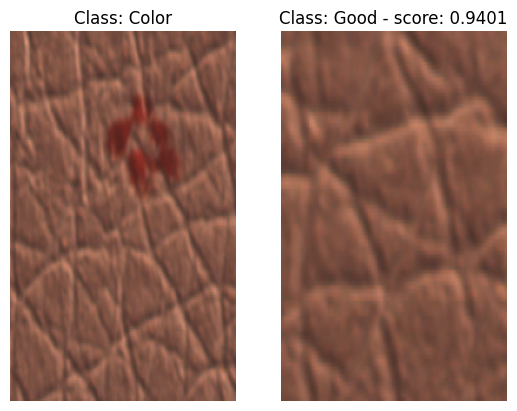

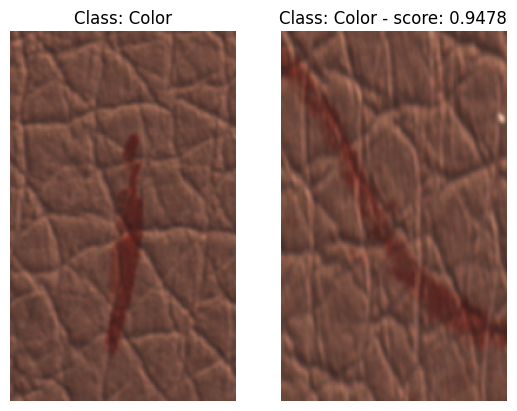

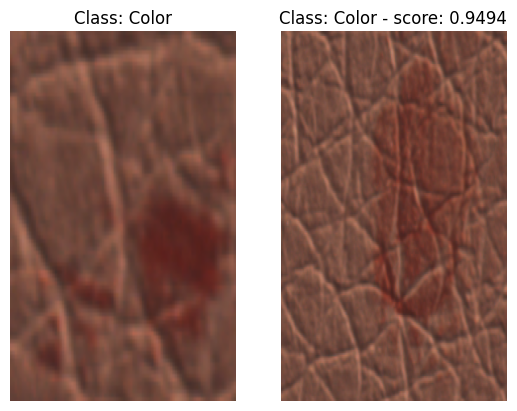

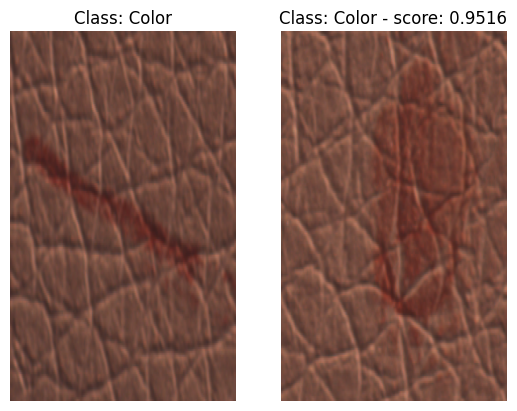

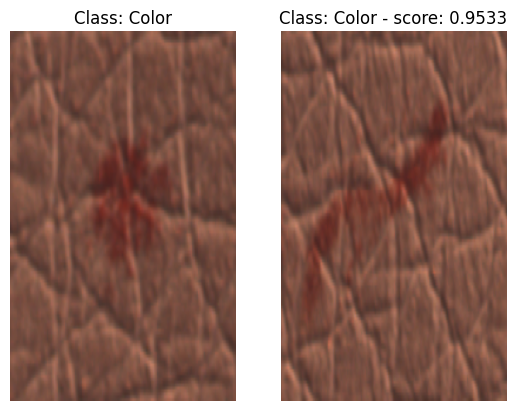

...

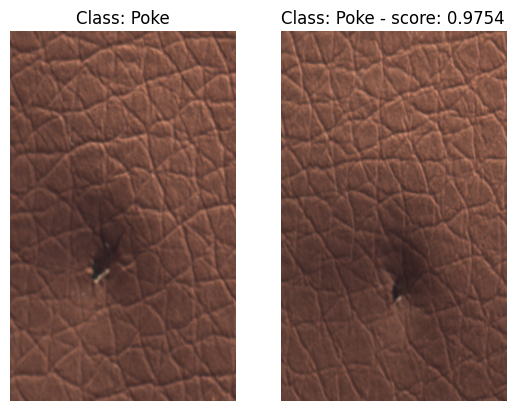

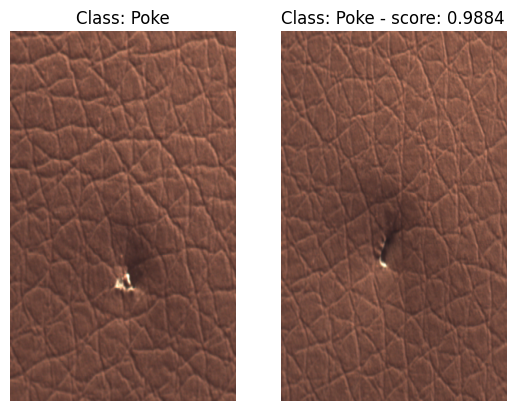

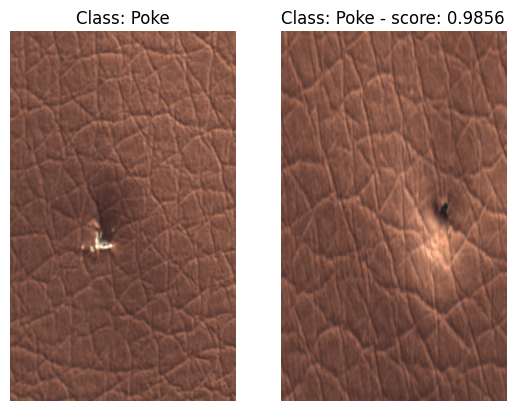

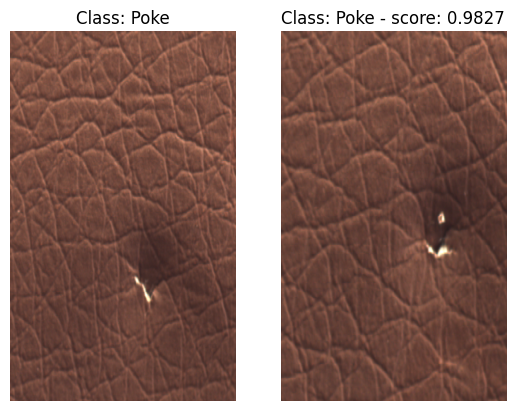

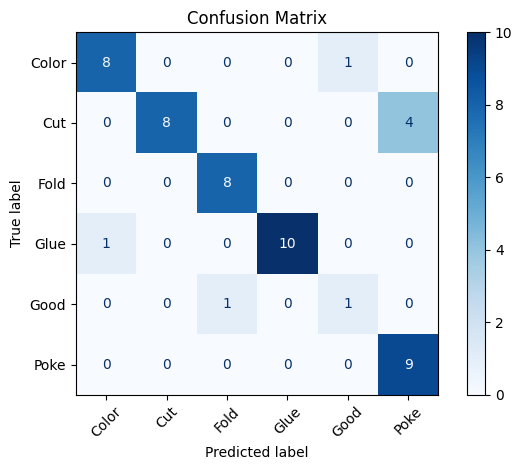

Classification Report:
              precision    recall  f1-score   support

       Color       0.89      0.89      0.89         9
         Cut       1.00      0.67      0.80        12
        Fold       0.89      1.00      0.94         8
        Glue       1.00      0.91      0.95        11
        Good       0.50      0.50      0.50         2
        Poke       0.69      1.00      0.82         9

    accuracy                           0.86        51
   macro avg       0.83      0.83      0.82        51
weighted avg       0.89      0.86      0.86        51



In [38]:
# Test all images in test dataset
y_true = []
y_pred = []
for img in test_dataset:
        
    result = client.query_points(
        collection_name=my_collection,
        query=img['embeddings'],
        limit=1
    ).points

    image_id = result[0].payload['image_id']
    image = dataset.filter(
            lambda x: x == image_id, input_columns="image_id"
        ).select_columns("image")[0]['image']

    # Append original class and predicted class
    y_true.append(classes_dict[img['class']])
    y_pred.append(classes_dict[result[0].payload['class']])

    # Display the original image and the found image using matplotlib together with score
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img['image'], cmap="gray", aspect='auto')
    axs[0].set_title(f"Class: {img['class']}")
    axs[0].axis('off')
    axs[1].imshow(image, cmap="gray", aspect='auto')
    axs[1].set_title(f"Class: {result[0].payload['class']} - score: {result[0].score:1.4f}")
    axs[1].axis('off')

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(classes_dict.keys()))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

report = classification_report(y_true, y_pred, target_names=list(classes_dict.keys()))
print("Classification Report:")
print(report)

### 2-D visualization

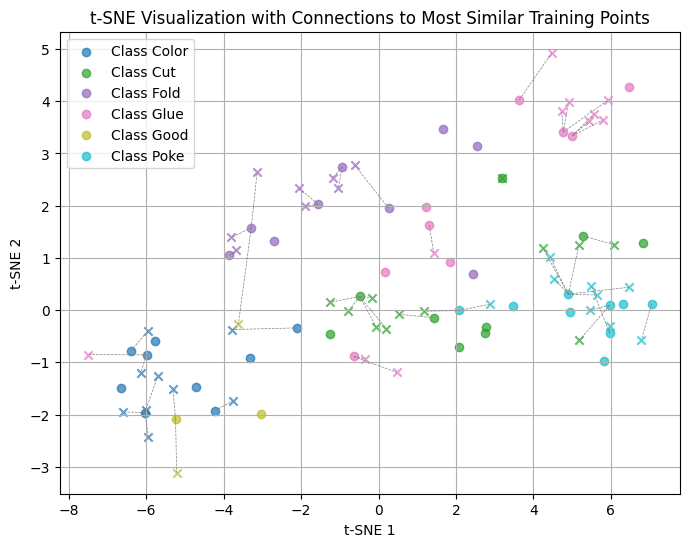

In [39]:
from sklearn.metrics.pairwise import cosine_similarity


tsne = TSNE(n_components=2, random_state=42, perplexity=30)

train_embeddings = np.array(dataset['embeddings'])
test_embeddings = np.array(test_dataset['embeddings'])

pooled_embeddings = np.concatenate(
    (train_embeddings,test_embeddings),
    axis=0)

tsne_transformed_embeddings = tsne.fit_transform(pooled_embeddings)

y_train = np.array(dataset['class'])
y_test = np.array(test_dataset['class'])

y_pooled = np.concatenate(
    (y_train,y_test),
    axis=0)

plt.figure(figsize=(8, 6))

unique_labels = np.unique(y_train)
cmap = plt.get_cmap('tab10', len(unique_labels)) # Get a colormap

# Plot training data
for i, label in enumerate(unique_labels):
    class_color = cmap(i / (len(unique_labels) - 1) if len(unique_labels) > 1 else cmap(0))
    idx_train = (y_pooled == label) & (np.arange(len(y_pooled)) < len(y_train))
    plt.scatter(tsne_transformed_embeddings[idx_train, 0], tsne_transformed_embeddings[idx_train, 1],
                label=f"Class {label}", alpha=0.7, marker='o', color=class_color)

# Plot test data and connect to most similar training point
for i_test in range(len(test_embeddings)):
    test_embedding = test_embeddings[i_test]
    # Calculate cosine similarity between the current test embedding and all training embeddings
    similarities = cosine_similarity(test_embedding.reshape(1, -1), train_embeddings)[0]
    # Find the index of the most similar training embedding
    most_similar_index = np.argmax(similarities)

    # Get the t-SNE coordinates of the test point and the most similar training point
    test_tsne = tsne_transformed_embeddings[len(train_embeddings) + i_test]
    train_tsne = tsne_transformed_embeddings[most_similar_index]

    # Get the class label of the test point to assign the correct color
    test_label = y_test[i_test]
    label_index = np.where(unique_labels == test_label)[0][0]
    class_color = cmap(label_index / (len(unique_labels) - 1) if len(unique_labels) > 1 else cmap(0))

    # Plot the test point with a different marker
    plt.scatter(test_tsne[0], test_tsne[1],
                label="", # Only add label once
                alpha=0.7, marker='x', color=class_color)

    # Plot the connecting line
    plt.plot([train_tsne[0], test_tsne[0]], [train_tsne[1], test_tsne[1]],
             color='gray', linestyle='--', linewidth=0.5)

plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.title("t-SNE Visualization with Connections to Most Similar Training Points")
plt.show()